## 1. Data Analysis

### Load Cars and Not Cars Data

In [1]:
import glob
import cv2
cars = glob.glob('training_data/vehicles/**/*.png')
notcars = glob.glob('training_data/non-vehicles/**/*.png')

print("Cars Num : " + str(len(cars)))
print("Not Cars Num : " + str(len(notcars)))

Cars Num : 8792
Not Cars Num : 8968


### Visualize Data

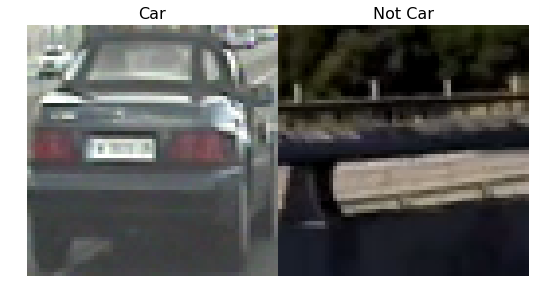

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(1,2, figsize=(9, 9))
fig.subplots_adjust(hspace = .2, wspace=.001)
ax = ax.ravel()

# show a car image
img = cv2.imread(cars[np.random.randint(0,len(cars))])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
ax[0].axis('off')
ax[0].set_title('Car', fontsize=16)
ax[0].imshow(img)

# show a non-car image
img = cv2.imread(notcars[np.random.randint(0,len(notcars))])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
ax[1].axis('off')
ax[1].set_title('Not Car', fontsize=16)
ax[1].imshow(img)

## 2. Features Extraction

### A. Histogram of Gradients (HOG)

In [3]:
from skimage.feature import hog

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

C:\Users\akotb\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


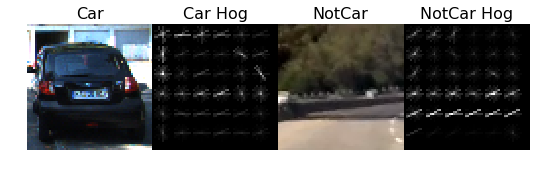

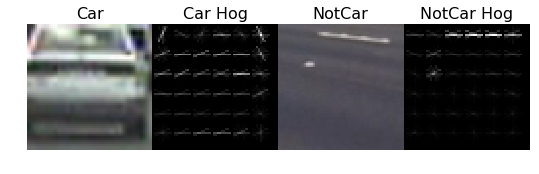

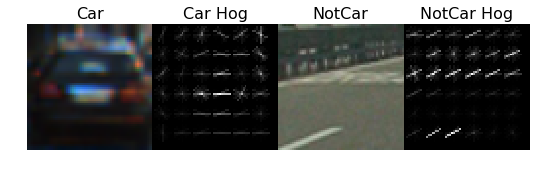

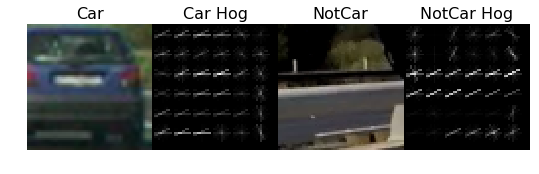

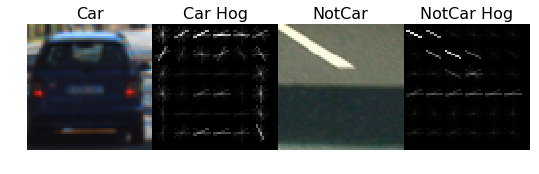

In [4]:
# HOG parameters
orient = 12
pix_per_cell = 10
cell_per_block = 2

for i in range(5):
    fig, ax = plt.subplots(1,4, figsize=(9, 9))
    fig.subplots_adjust(hspace = .2, wspace=.001)
    ax = ax.ravel()
    sample_id = np.random.randint(0,len(cars))
    # show a car image
    car_img = cv2.imread(cars[sample_id])
    car_img = cv2.cvtColor(car_img, cv2.COLOR_BGR2RGB)
    ax[0].axis('off')
    ax[0].set_title('Car', fontsize=16)
    ax[0].imshow(car_img)

    car_gray = cv2.cvtColor(car_img, cv2.COLOR_RGB2GRAY)
    feat, car_hog = get_hog_features(car_gray, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
    ax[1].axis('off')
    ax[1].set_title('Car Hog', fontsize=16)
    ax[1].imshow(car_hog, cmap ='gray')

    # show a not-car image
    notcar_img = cv2.imread(notcars[sample_id])
    notcar_img = cv2.cvtColor(notcar_img, cv2.COLOR_BGR2RGB)
    ax[2].axis('off')
    ax[2].set_title('NotCar', fontsize=16)
    ax[2].imshow(notcar_img)

    notcar_gray = cv2.cvtColor(notcar_img, cv2.COLOR_RGB2GRAY)
    feat, notcar_hog = get_hog_features(notcar_gray, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
    ax[3].axis('off')
    ax[3].set_title('NotCar Hog', fontsize=16)
    ax[3].imshow(notcar_hog, cmap ='gray')

C:\Users\akotb\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


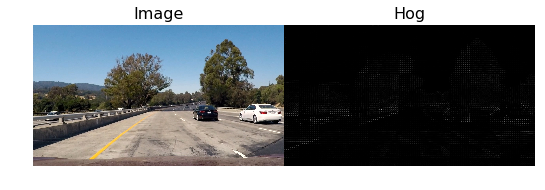

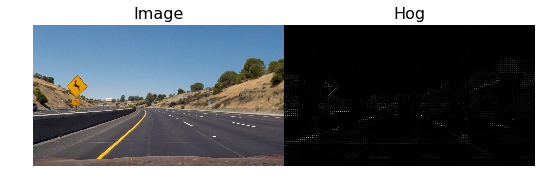

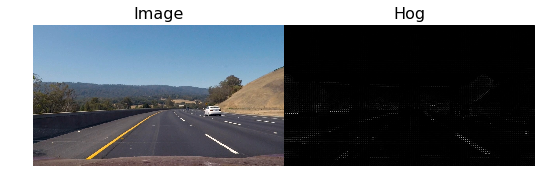

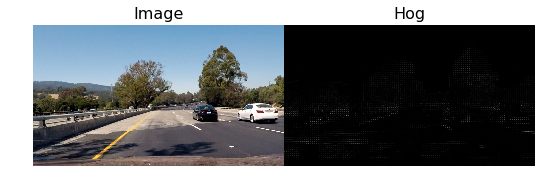

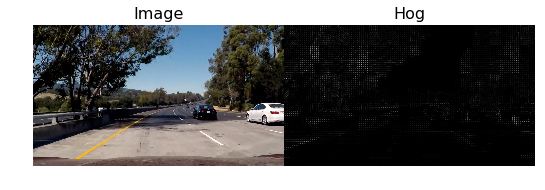

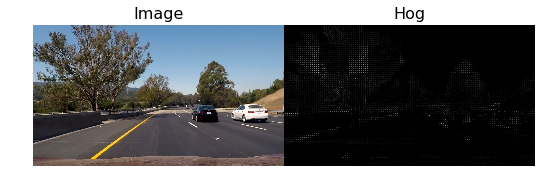

In [5]:
from os import listdir
# Test Color histogram features extraction
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(1,2, figsize=(9, 9))
    fig.subplots_adjust(hspace = .2, wspace=.001)
    ax = ax.ravel()

    # show image
    ax[0].axis('off')
    ax[0].set_title('Image', fontsize=16)
    ax[0].imshow(img)

    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    feat, img_hog = get_hog_features(img_gray, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
    ax[1].axis('off')
    ax[1].set_title('Hog', fontsize=16)
    ax[1].imshow(img_hog, cmap ='gray')

### B. Color Histograms Features

In [6]:
# Extract features from the color histogram
def color_hist_features(img, nbins, bins_range):
    # Calclate the histograms for each channel seperately
    chan1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range) 
    chan2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    chan3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Generate bins centers
    bins_edges = chan1_hist[1]
    bins_centers = (bins_edges[1:] + bins_edges[0:len(bins_edges)-1])/2
    # Concatenate all features together
    color_hist_features = np.concatenate((chan1_hist[0], chan2_hist[1], chan3_hist[0]))
    
    # return the histogram features which is the most important one from this function
    # However, the otehr histograms and bins centers will be needed to be visualized in testing this function
    return color_hist_features, chan1_hist, chan2_hist, chan3_hist, bins_centers

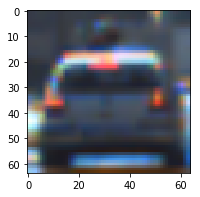

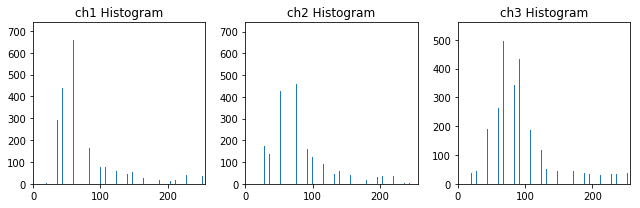

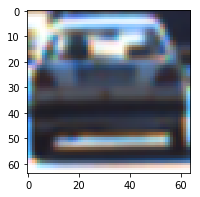

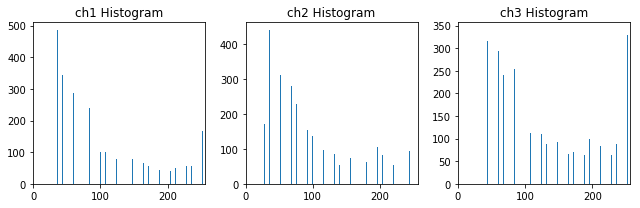

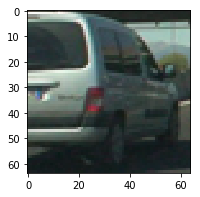

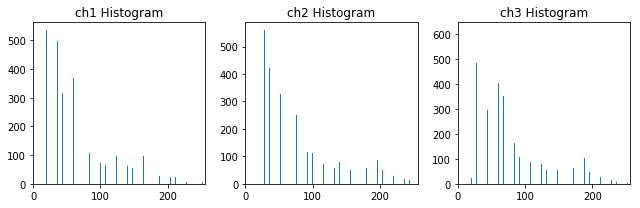

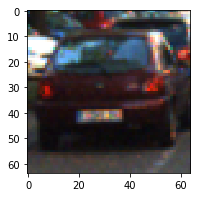

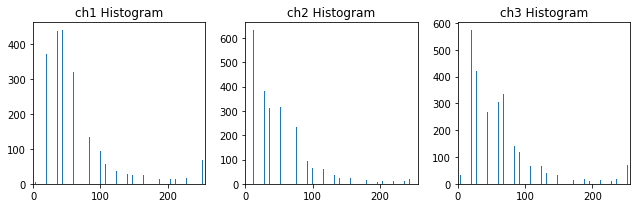

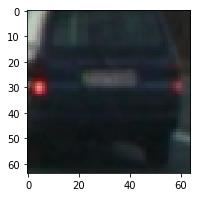

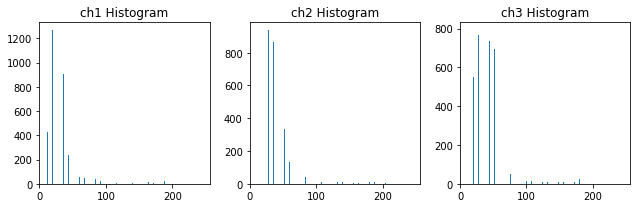

In [7]:
nbins = 32
bins_range = (0,256)
for i in range(5):
    sample_id = np.random.randint(0,len(cars))
    # show a car image
    car_img = cv2.imread(cars[sample_id])
    car_img = cv2.cvtColor(car_img, cv2.COLOR_BGR2RGB)
    
    test_features, test_ch1, test_ch2, test_ch3, test_centers = color_hist_features(car_img, 
                                                                            nbins=nbins, 
                                                                            bins_range=bins_range)
        
    fig = plt.figure(figsize=(3,3))
    plt.imshow(car_img)
    fig = plt.figure(figsize=(9,3))
    plt.subplot(131)
    plt.bar(test_centers, test_ch1[0])
    plt.xlim(0, 256)
    plt.title('ch1 Histogram')
    plt.subplot(132)
    plt.bar(test_centers, test_ch2[0])
    plt.xlim(0, 256)
    plt.title('ch2 Histogram')
    plt.subplot(133)
    plt.bar(test_centers, test_ch3[0])
    plt.xlim(0, 256)
    plt.title('ch3 Histogram')
    fig.tight_layout()
    plt.show()

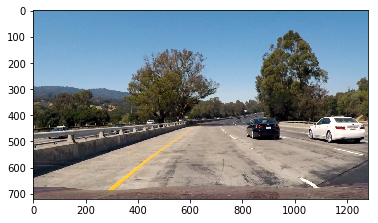

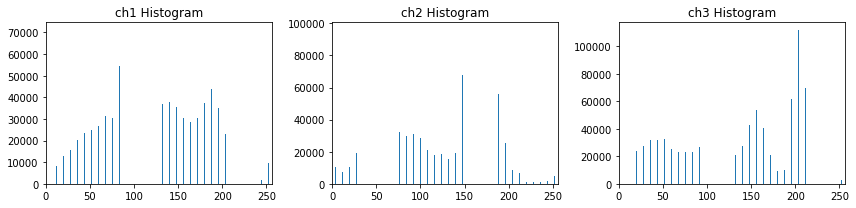

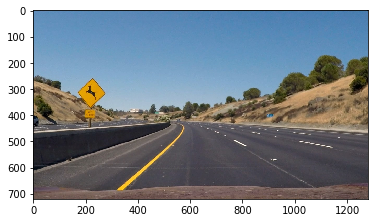

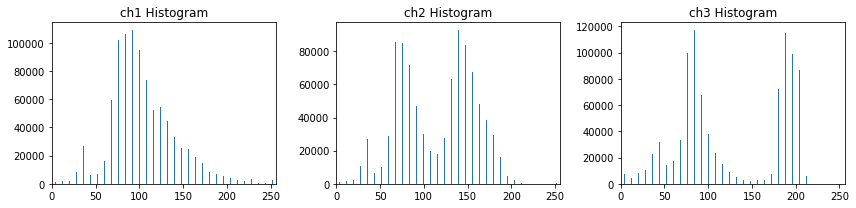

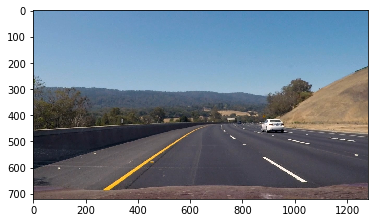

...

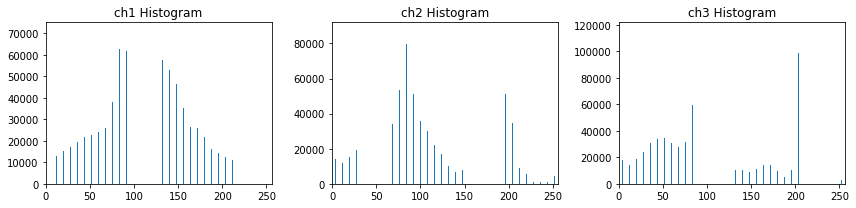

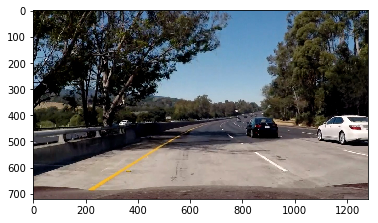

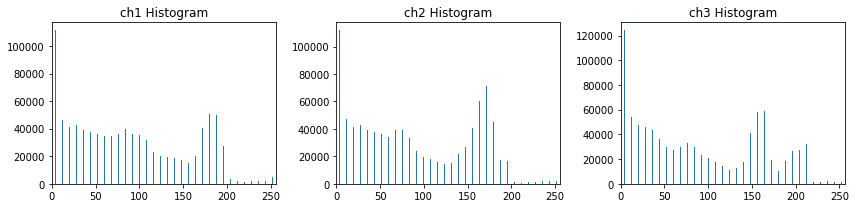

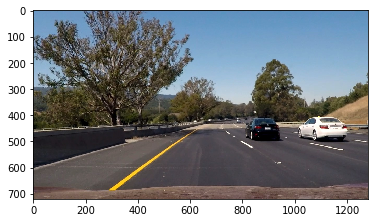

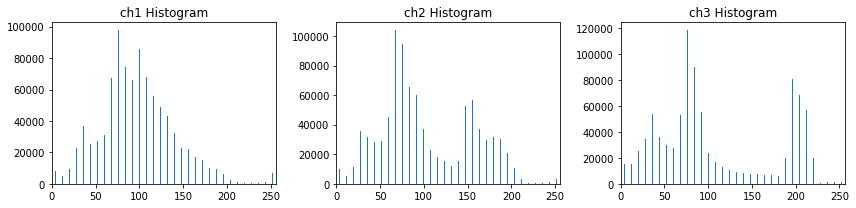

In [8]:
# Test Color histogram features extraction
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    test_features, test_ch1, test_ch2, test_ch3, test_centers = color_hist_features(img, 
                                                                                nbins=nbins, 
                                                                                bins_range=bins_range)
    fig = plt.figure()
    plt.imshow(img)
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(test_centers, test_ch1[0])
    plt.xlim(0, 256)
    plt.title('ch1 Histogram')
    plt.subplot(132)
    plt.bar(test_centers, test_ch2[0])
    plt.xlim(0, 256)
    plt.title('ch2 Histogram')
    plt.subplot(133)
    plt.bar(test_centers, test_ch3[0])
    plt.xlim(0, 256)
    plt.title('ch3 Histogram')
    fig.tight_layout()
    plt.show()

### C. Color Spatial Bining Features

In [9]:
# Extract features from the Color spatial Bining
def bin_spatial(img, color_space, size):
    # convert the image into the color space sent into the function
    if color_space != "RGB":
        if color_space == "HSV":
            feature_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == "HLS":
            feature_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == "LUV":
            feature_img = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == "YUV":
            feature_img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == "YCrCb":
            feature_img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        elif color_space == "GRAY":
            feature_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        feature_img = np.copy(img)
    
    # flatten the features extarcted from the image after resizing
    bin_spatial_features = cv2.resize(feature_img, size).ravel()
    
    # return these features
    return bin_spatial_features, feature_img

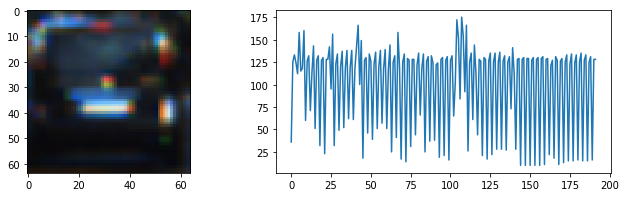

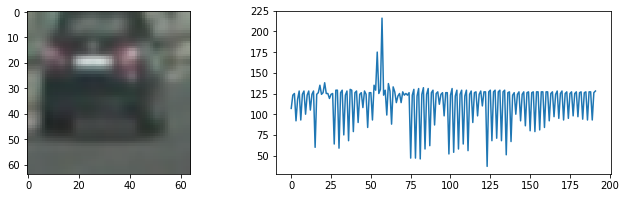

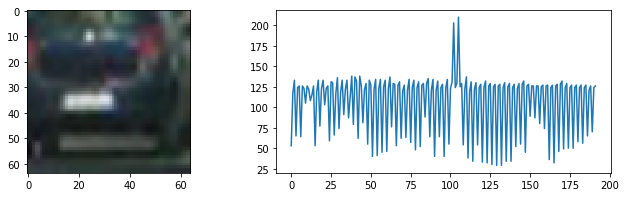

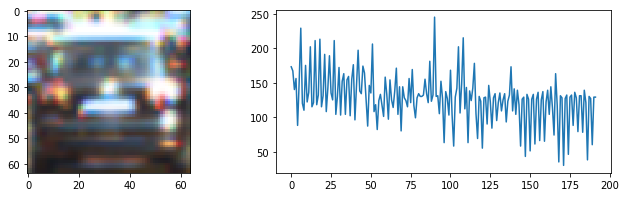

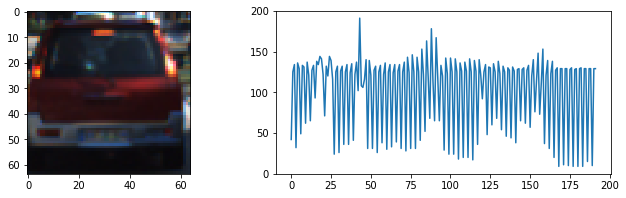

In [10]:
color_space = "YCrCb"
size = (8,8)
for i in range(5):
    sample_id = np.random.randint(0,len(cars))
    # show a car image
    car_img = cv2.imread(cars[sample_id])
    car_img= cv2.cvtColor(car_img, cv2.COLOR_BGR2RGB)
    
    test_features, test_img_converted = bin_spatial(car_img, color_space=color_space, size=size)
        
    fig, ax = plt.subplots(1,2, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)
    ax = ax.ravel()

    # show image
    ax[0].imshow(car_img)
    ax[1].plot(test_features)
    

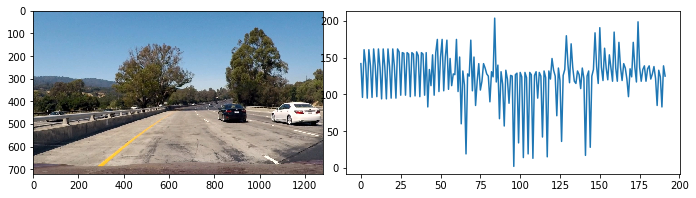

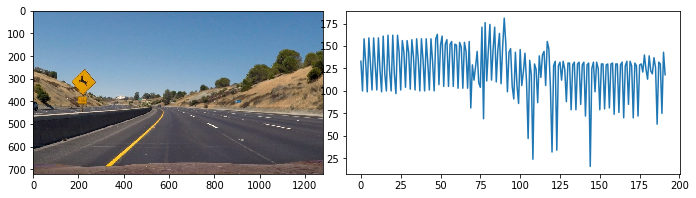

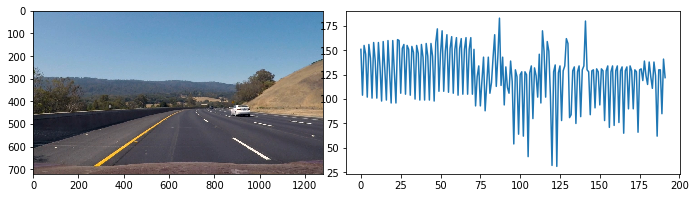

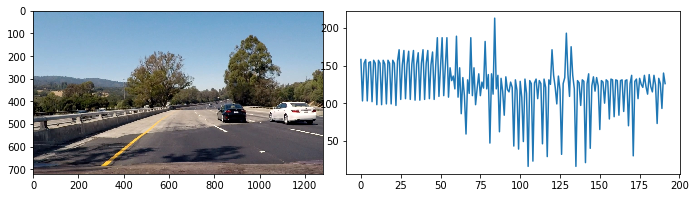

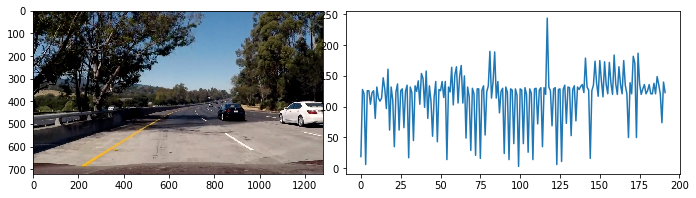

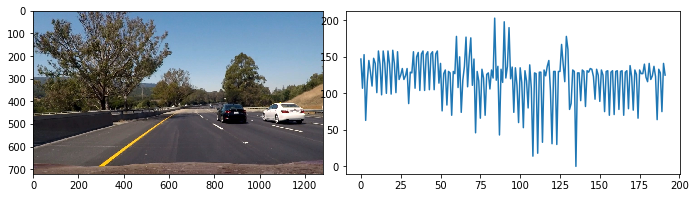

In [11]:
# Test Color histogram features extraction
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    test_features, test_img_converted = bin_spatial(img, color_space=color_space, size=size)
    
    fig, ax = plt.subplots(1,2, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)
    ax = ax.ravel()

    # show image
    ax[0].imshow(img)
    ax[1].plot(test_features)

### D. Combine Features (HOG & Color Histogram & Bin Spatial)

In [12]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

def extract_features(imgs, color_space, spatial_size,
                        hist_bins, orient,bins_range, 
                        pix_per_cell, cell_per_block, hog_channel,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = cv2.imread(file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=bins_range)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

def extract_features_One_image(image, color_space, spatial_size,
                                hist_bins, orient,bins_range, 
                                pix_per_cell, cell_per_block, hog_channel,
                                spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    image_features = []
    # apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)      

    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        image_features.append(spatial_features)
    if hist_feat == True:
        # Apply color_hist()
        hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=bins_range)
        image_features.append(hist_features)
    if hog_feat == True:
    # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # Append the new feature vector to the features list
        image_features.append(hog_features)

    features.append(np.concatenate(image_features))
    # Return list of feature vectors
    return features

def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

## 3. Build Classfier (SVM)

### A. Extract Features for Data

In [13]:
import time
from sklearn.model_selection import train_test_split
#Feature Extraction Parameters
#################################
orient = 8
pix_per_cell = 8
cell_per_block = 2
hist_bins = 32
bins_range = (0,256)
color_space = "YCrCb"
spatial_size = (16,16)
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
y_start_stop = [400, 680]
################################

t = time.time()
car_features = extract_features(cars,color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,bins_range=bins_range, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=True, hist_feat=True, hog_feat=True)
notcar_features = extract_features(notcars,color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,bins_range=bins_range, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=True, hist_feat=True, hog_feat=True)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract Combined features...')
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)  

# Fit a per-column scaler - this will be necessary if combining different types of features (HOG + color_hist/bin_spatial)
#X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
#scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

C:\Users\akotb\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


133.67 Seconds to extract Combined features...
Using: 8 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 5568


### B. Data Normalization and Labeling

In [14]:
from sklearn.preprocessing import StandardScaler
# Combine features of cars and notcars together
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)

# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

print('Feature vector length:', len(X_train[0]))

Feature vector length: 5568


### C. Train

In [15]:
from sklearn.svm import LinearSVC
# Use a linear SVC
svc = LinearSVC() # C=5.0, gamma='auto', kernel='rbf'
#svc = SVC(C=5.0,kernel='rbf')

# Check the training time for the SVC
t = time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2 - t, 2), 'Seconds to train SVC...')


# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t = time.time()

6.55 Seconds to train SVC...
Test Accuracy of SVC =  0.9921


## 4. Sliding Window

### A. Sliding Window Operation and Drawing Boxes

In [16]:
# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

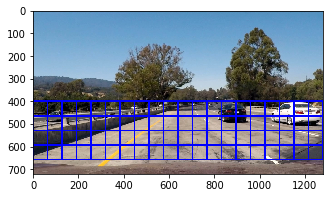

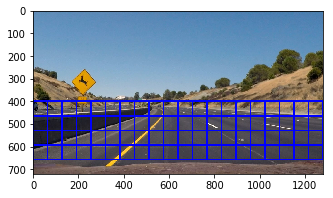

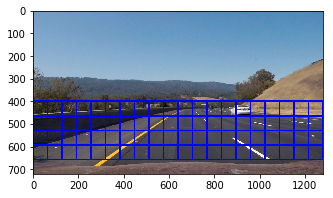

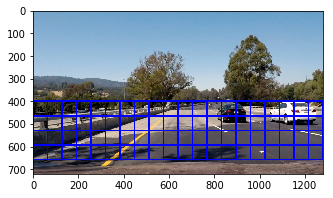

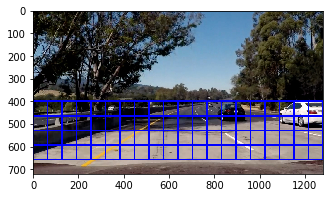

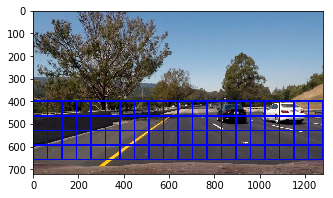

In [17]:
path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    x_max = img.shape[1]
    y_max = img.shape[0] - 20
    
    windows = slide_window(img, x_start_stop=(0, x_max), y_start_stop=(400, y_max), 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5))
    
    window_img = draw_boxes(img, windows, color=(0, 0, 255), thick=6)                    

    fig, ax = plt.subplots(1,1, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax.imshow(window_img)

### B. Multi Scale Windows

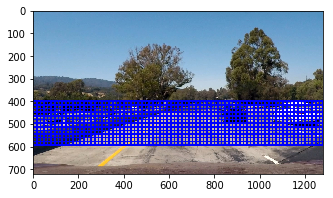

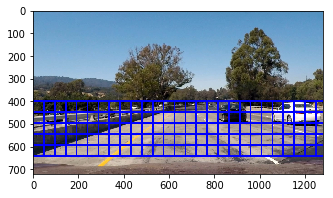

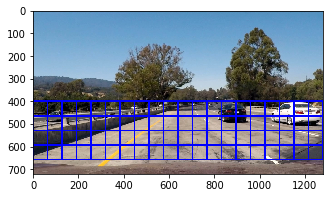

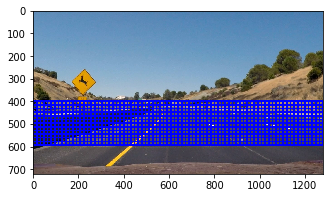

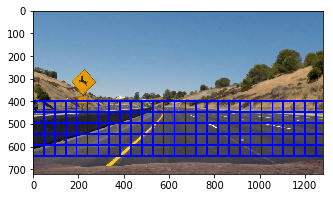

...

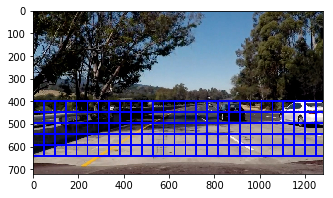

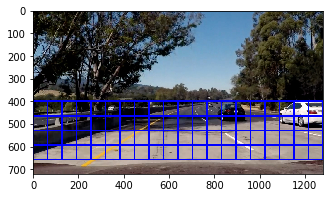

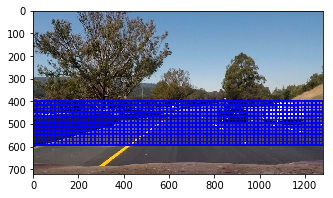

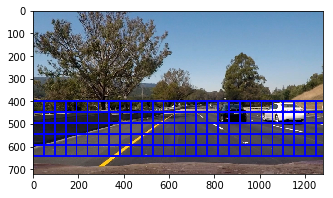

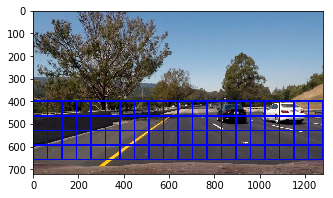

In [18]:
#Parameters
#####################
num_sizes = 4
y_axis_start = 400
y_axis_offset = 20
#####################

path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    x_max = img.shape[1]
    y_max = img.shape[0] - y_axis_offset

    # get windows from slide_window function with multiscale sliding window
    windows = slide_window(img, x_start_stop=[None, 1300], y_start_stop=[400,600],
                            xy_window=(32, 32), xy_overlap=(0.5, 0.5))
    
    window_img = draw_boxes(img, windows, color=(0, 0, 255), thick=6)                    

    fig, ax = plt.subplots(1,1, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax.imshow(window_img)
        
    windows = slide_window(img, x_start_stop=[None, 1300], y_start_stop=y_start_stop,
                            xy_window=(96, 96), xy_overlap=(0.5, 0.5))

    window_img = draw_boxes(img, windows, color=(0, 0, 255), thick=6)                    

    fig, ax = plt.subplots(1,1, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax.imshow(window_img)
        
    windows = slide_window(img, x_start_stop=[None, 1300], y_start_stop=y_start_stop,
                            xy_window=(128, 128), xy_overlap=(0.5, 0.5))

    window_img = draw_boxes(img, windows, color=(0, 0, 255), thick=6)                    

    fig, ax = plt.subplots(1,1, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax.imshow(window_img)

## 5. Search and Classify

In [19]:
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9,
                    bins_range=32,
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using extract_features_One_image()
        features = extract_features_One_image(test_img,color_space=color_space, spatial_size=spatial_size,
                                hist_bins=hist_bins, orient=orient,bins_range=bins_range, 
                                pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                                spatial_feat=True, hist_feat=True, hog_feat=True)

        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

C:\Users\akotb\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


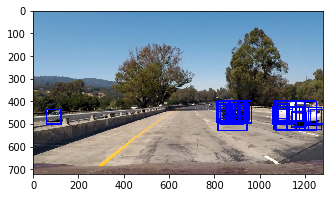

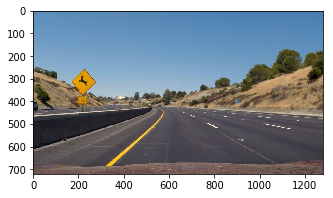

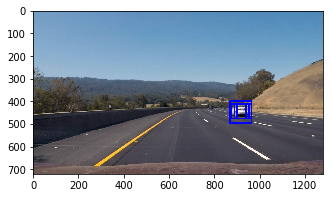

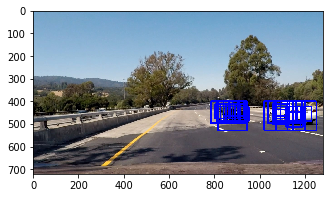

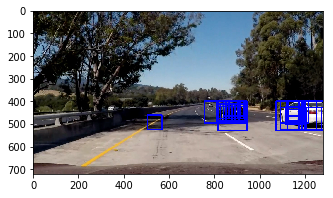

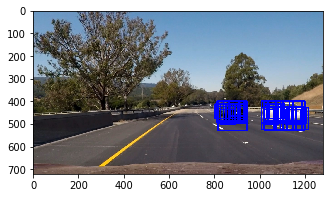

In [20]:
#Parameters
#####################
y_start_stop = [400, 680] 
#####################

path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    draw_image = np.copy(img)

    # get windows from slide_window function with multiscale sliding window
    windows = slide_window(img, x_start_stop=[None, 1300], y_start_stop=y_start_stop,
                            xy_window=(64, 64), xy_overlap=(0.8, 0.8))
    
    windows += slide_window(img, x_start_stop=[None, 1300], y_start_stop=y_start_stop,
                            xy_window=(96, 96), xy_overlap=(0.7, 0.7))

    windows += slide_window(img, x_start_stop=[None, 1300], y_start_stop=y_start_stop,
                            xy_window=(128, 128), xy_overlap=(0.6, 0.6))
    
    hot_windows = search_windows(img, windows,clf = svc,scaler = X_scaler, color_space=color_space, 
                    spatial_size=spatial_size, hist_bins=hist_bins, 
                    orient=orient,bins_range=bins_range, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spatial_feat=True, hist_feat=True, hog_feat=True) 
    
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    fig, ax = plt.subplots(1,1, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax.imshow(window_img)

### SubSampling Window Search

In [21]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    # array of rectangles where cars were detected
    rectangles = []
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left+xstart, ytop_draw+ystart),(xbox_left+win_draw+xstart,ytop_draw+win_draw+ystart)))
                
    return rectangles

C:\Users\akotb\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


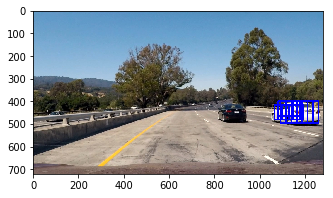

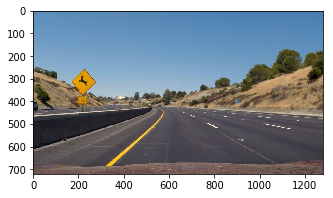

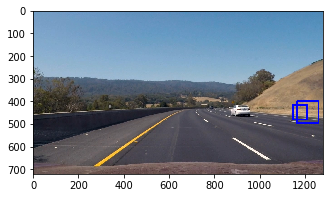

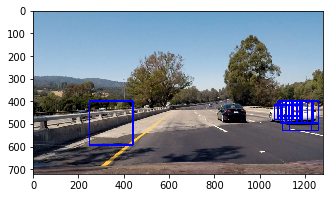

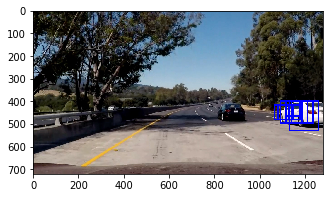

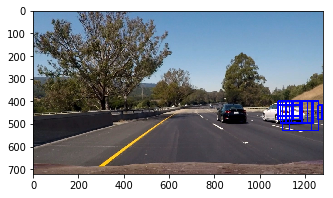

In [22]:
for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    
    # 64x64 boxes with 0.75 overlapping
    xstart = 250
    xstop = 1000

    ystart = 400
    ystop = 464
    scale = 1.0
    windows = find_cars(img, ystart, ystop,xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    ystart = 416
    ystop = 480
    scale = 1.0
    windows += find_cars(img, ystart, ystop,xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    # 96x96 boxes with 0.75 overlapping
    xstart = 300
    xstop = 1300

    ystart = 400
    ystop = 496
    scale = 1.5
    windows += find_cars(img, ystart, ystop,xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    ystart = 432
    ystop = 528
    scale = 1.5
    windows += find_cars(img, ystart, ystop,xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    # 128x128 boxes with 0.75 overlapping
    xstart = 300
    xstop = 1300

    ystart = 400
    ystop = 528
    scale = 2.0
    
    windows += find_cars(img, ystart, ystop,xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    ystart = 432
    ystop = 560
    scale = 2.0
    
    windows += find_cars(img, ystart, ystop,xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    # 192x192 boxes with 0.75 overlapping
    xstart = 200
    xstop = 1300

    ystart = 400
    ystop = 592
    scale = 3.0
    windows += find_cars(img, ystart, ystop,xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    ystart = 448
    ystop = 640
    scale = 3.0
    windows += find_cars(img, ystart, ystop,xstart, xstop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    window_img = draw_boxes(img, windows, color=(0, 0, 255), thick=6)                    

    fig, ax = plt.subplots(1,1, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax.imshow(window_img)

## 6. False Positives Handling

In [23]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

C:\Users\akotb\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


[[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]
[[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]
[[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]
[[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]
[[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]


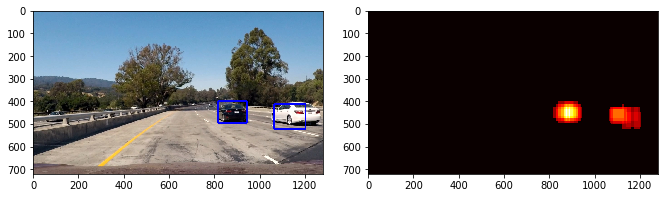

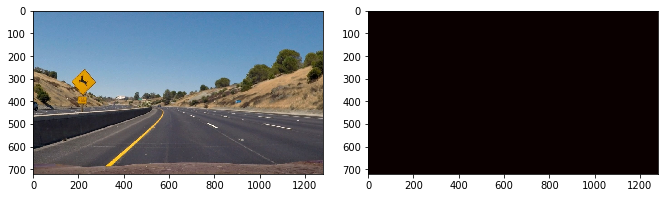

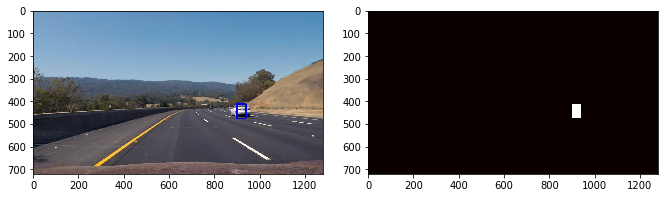

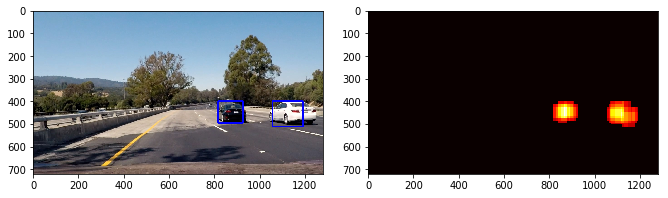

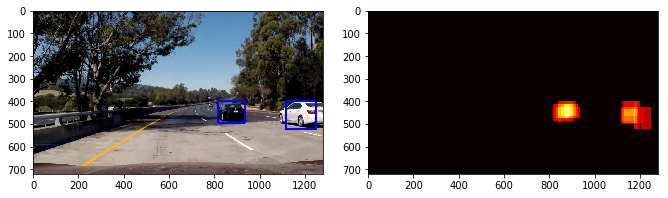

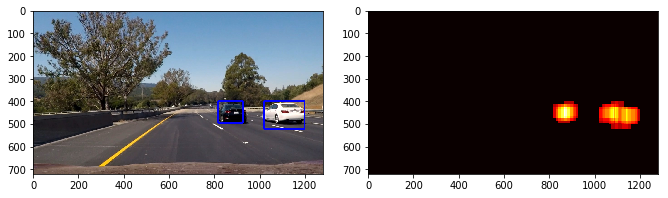

In [24]:
from scipy.ndimage.measurements import label
#Parameters
#####################
y_start_stop = [400, 680] 
#####################

path = "test_images"
imagesList = listdir(path)

for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    draw_image = np.copy(img)
    
    # get windows from slide_window function with multiscale sliding window
    windows = slide_window(img, x_start_stop=[None, 1300], y_start_stop=y_start_stop,
                            xy_window=(64, 64), xy_overlap=(0.8, 0.8))
    
    windows += slide_window(img, x_start_stop=[None, 1300], y_start_stop=y_start_stop,
                            xy_window=(96, 96), xy_overlap=(0.7, 0.7))

    windows += slide_window(img, x_start_stop=[None, 1300], y_start_stop=y_start_stop,
                            xy_window=(128, 128), xy_overlap=(0.6, 0.6))

    
    hot_windows = search_windows(img, windows,clf = svc,scaler = X_scaler, color_space=color_space, 
                    spatial_size=spatial_size, hist_bins=hist_bins, 
                    orient=orient,bins_range=bins_range, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spatial_feat=True, hist_feat=True, hog_feat=True) 
    
    # Add heat to each box in box list
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat = add_heat(heat,hot_windows)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,3)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    print(heat)
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    
    draw_img = draw_labeled_bboxes(draw_image, labels)

    #window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    fig, ax = plt.subplots(1,2, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax[0].imshow(draw_img)
    ax[1].imshow(heatmap, cmap='hot')

## 5. Pipeline

## Parameters

In [25]:
#Parameters
#################################
orient = 8
pix_per_cell = 8
cell_per_block = 2
hist_bins = 32
bins_range = (0,256)
color_space = "YCrCb"
spatial_size = (16,16)
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
y_start_stop = [400, 680]
################################

## Pipeline

In [32]:
def process_image(img):
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    draw_image = np.copy(img)

    # get windows from slide_window function with multiscale sliding window
    windows = slide_window(img, x_start_stop=[400, 1300], y_start_stop=y_start_stop,
                            xy_window=(64, 64), xy_overlap=(0.85, 0.85))
    
    windows += slide_window(img, x_start_stop=[400, 1300], y_start_stop=y_start_stop,
                            xy_window=(96, 96), xy_overlap=(0.75, 0.75))

    windows += slide_window(img, x_start_stop=[400, 1300], y_start_stop=y_start_stop,
                            xy_window=(128, 128), xy_overlap=(0.65, 0.65))
    
    
    hot_windows = search_windows(img, windows,clf = svc,scaler = X_scaler, color_space=color_space, 
                    spatial_size=spatial_size, hist_bins=hist_bins, 
                    orient=orient,bins_range=bins_range, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spatial_feat=True, hist_feat=True, hog_feat=True) 
    
    # Add heat to each box in box list
    temp_heat = np.zeros_like(img[:,:,0]).astype(np.float)
    temp_heat = add_heat(temp_heat,hot_windows)

    # Apply threshold to help remove false positives
    temp_heat = apply_threshold(temp_heat,3)
    
    global heat
    global counter
    
    if(counter == 60):
        counter = 0
        heat = temp_heat
    else:
        counter += 1
        heat = heat + temp_heat
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    
    draw_img = draw_labeled_bboxes(draw_image, labels)
    '''
    fig, ax = plt.subplots(1,3, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax[0].imshow(draw_img)
    ax[1].imshow(heatmap, cmap='hot')
    ax[2].imshow(labels[0], cmap='gray')
    plt.show()
    '''
    return draw_img

## Test Pipeline

C:\Users\akotb\AppData\Local\Continuum\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


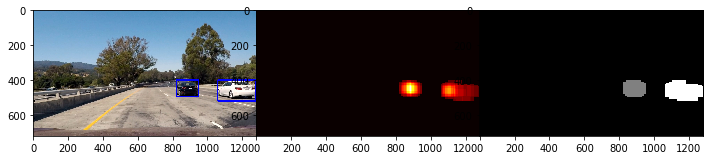

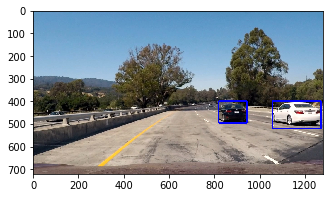

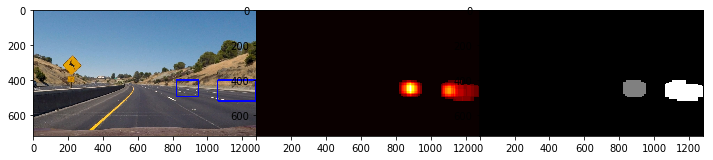

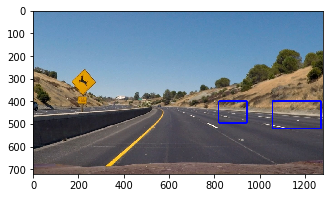

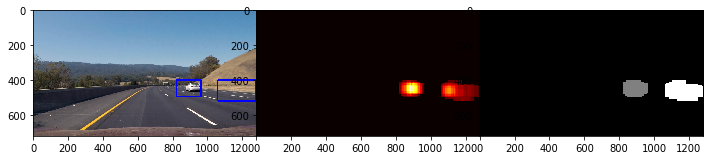

...

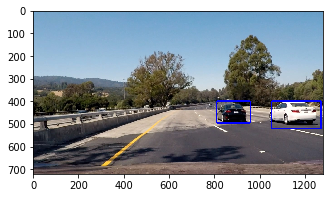

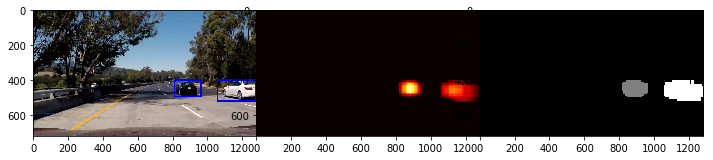

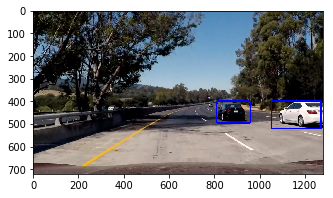

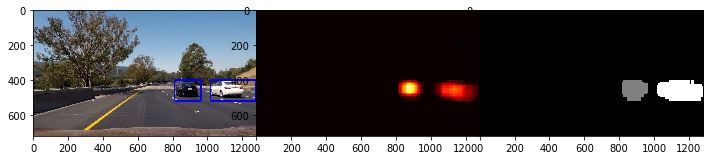

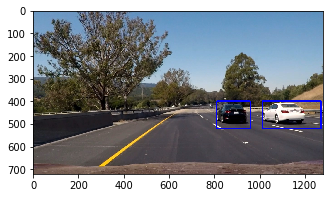

In [27]:
global heat
global counter
counter = 0
heat = np.zeros([720,1280]).astype(np.float)

for image in (imagesList):
    img = cv2.imread(path + "/" + image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    result = process_image(img)
    
    fig, ax = plt.subplots(1,1, figsize=(12, 3))
    fig.subplots_adjust(hspace = .2, wspace=.001)

    # show image
    ax.imshow(result)

## Project Video

In [ ]:
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import imageio
imageio.plugins.ffmpeg.download()

global heat
global counter
counter = 0
heat = np.zeros([720,1280]).astype(np.float)

project_output_video_2 = "Output.mp4"
clip2 = VideoFileClip("project_video.mp4")
output_video_2 = clip2.fl_image(process_image) #  NOTE: this function expects color images!!
%time output_video_2.write_videofile(project_output_video_2, audio=False)

[MoviePy] >>>> Building video Output.mp4
[MoviePy] Writing video Output.mp4



100%|███████████████████████████████████▉| 1258/1261 [4:07:18<00:39, 13.10s/it]